# Esempio Ecommerce

 ## Descrizione Variabili
 Di seguito una spiegazione delle variabili e del loro significato:
-   **DEALKEY**: identificativo quotazione testata (string)
-   **DEALDETKEY**: identificativo riga quotazione. Una quotazione pu`o avere
pi`u righe, ciascuna riferita ad un prodotto. (string)
-   **CUSTOMERID**: id cliente (string)
-   **CUSTOMER CREATE DATE**: data di prima registrazione cliente (date)
-   **CHANNELID**: id canale vendita (string)
-   **CUSTOMER DISCOUNT PERS**: sconto personalizzato cliente (float)
-   **HAS REAL ORDER** ( target variable): 1/0, quotazione trasformata/non
trasformata in ordine (bool)
-   **DEALVALUE**: valore riga quotazione, ORDER PRICE moltiplicato per
DEALQTY (float)
-   **ORIGINAL PRICE**: prezzo articolo (float)
-   **ORIGINAL PRICE NO DISCOUNT PERS**: prezzo articolo senza sconto
personalizzato (float)

-   **ORDER PRICE**: prezzo articolo scontato da quotazione e da sconto per-
sonalizzato ( DISCOUNT PCT, CUSTOMER DISCOUNT PERS) (float)

-   **DEALQTY**: numero pezzi. (int)
-   **QUOTATION DATE**: data quotazione (date)
-   **DISCOUNT PCT**: sconto quotazione (float)
-   **ARTID**: identificativo articolo (string)
-   **ARTID DATE CREATE**: data prima registrazione articolo (date)
-   **ARTDSC**: descrizione articolo (string)
-   **BRANDID**: brand articolo (string)
-   **CATEGORYID**: categoria merceologica. (string)
-   **CATEGORYDSC**: descrizione categ merceologica (string)
-   **BRANDDSC**: descrizione brand (string)
-   **CUSTOMER DISCOUNT PERS**: Alcuni clienti in Esprinet possono avere
uno sconto dedicato su determinati brand.

# Import Librerie, Funzioni e caricamento dati

In [2]:
import pandas as pd
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
import numpy as np
from scipy import stats
from datetime import datetime
from datetime import date

import plotly.express as px
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV

In [3]:
def calcola_KPI(df, variabile): # df originale, variabile su cui fare il calcolo dei kpi
    temp = df[variabile].value_counts().to_frame('conteggio_canale').reset_index()
    temp.columns = [variabile, 'conteggio_canale']
    temp['perc_canale'] = round(temp['conteggio_canale'] / temp['conteggio_canale'].sum(), 2)

    # calcolo quanti ordini siano andati a buon fine, quanti no, e la percentuale per ogni canale
    ORD_0 = df[df['HAS_REAL_ORDER'] == 0][variabile].value_counts().to_frame('ORD_0').reset_index() # ordini non eseguiti
    ORD_0.columns = [variabile, 'ORD_0']
    ORD_1 = df[df['HAS_REAL_ORDER'] == 1][variabile].value_counts().to_frame('ORD_1').reset_index() # ordini eseguiti
    ORD_1.columns = [variabile, 'ORD_1']
    temp = pd.merge(temp, ORD_0, on=variabile)
    temp = pd.merge(temp, ORD_1, on=variabile)
    temp['ORD_TOT'] = temp['ORD_0'] + temp['ORD_1']
    temp['CONV_RATE'] = round(temp['ORD_1']/temp['ORD_TOT'] , 3) # % ordini effettivi sul totale per riga

    # calcolo il valore generato SOLO PER GLI ORDINI EFFETTUATI DEALVALUE
    valore = df[df['HAS_REAL_ORDER'] == 1].groupby(variabile, as_index=False)['DEALVALUE'].sum()
    temp = pd.merge(temp, valore, on=variabile)
    return temp

def find_outliers_IQR(df, variabile):
   q1=df[variabile].quantile(0.25)
   q3=df[variabile].quantile(0.75)
   IQR=q3-q1
   outliers = df[((df[variabile]<(q1-1.5*IQR)) | (df[variabile]>(q3+1.5*IQR)))]
   upper_limit = q3+1.5*IQR

   return outliers, upper_limit

def print_score(clf, X_train, y_train, X_test, y_test, train=True):
    if train:
        pred = clf.predict(X_train)
        clf_report = pd.DataFrame(classification_report(y_train, pred, output_dict=True))
        print("Train Result:\n================================================")
        print(f"Accuracy Score: {accuracy_score(y_train, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: \n {confusion_matrix(y_train, pred)}\n")
        
    elif train==False:
        pred = clf.predict(X_test)
        clf_report = pd.DataFrame(classification_report(y_test, pred, output_dict=True))
        print("Test Result:\n================================================")        
        print(f"Accuracy Score: {accuracy_score(y_test, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: \n {confusion_matrix(y_test, pred)}\n")

In [4]:
esprinet = pd.read_csv('_case_study_anonymized.csv', sep='|', encoding="latin")
esprinet.drop(columns = 'Unnamed: 0', inplace=True)
esprinet.head(5)

,DEALKEY,DEALDETKEY,CUSTOMERID,CHANNELID,CHANNELDSC,HAS_REAL_ORDER,DEALVALUE,DEALQTY,ORDER_PRICE,ORIGINAL_PRICE,ORIGINAL_PRICE_NO_DISCOUNT_PERS,QUOTATION_DATE,CUSTOMER_DISCOUNT_PERS,DISCOUNT_PCT,ARTID_DATE_CREATE,ARTID,ARTDSC,BRANDID,CATEGORYID,CATEGORYDSC,BRANDDSC,CUSTOMER_CREATE_DATE
0,3682848.0,12089692.0,053e113f9b,SM,SALES UNIT MEDIUM BUSINESS,1,251.477800,1.0,251.477800,256.61,257.89305,2023-05-09,0.5,2.00,2013-08-28,FI-65F,FI-65F,FUJ,SH,SCANNER,FUJITSU,2011-02-01
1,3644306.0,11997831.0,b6fc01a771,CS,OFFICE PRODUCTS SALES AREA,1,67.257400,1.0,67.257400,68.63,68.63000,2023-03-08,0.0,2.00,2020-05-13,KCN-00032,SRFC GO TYPE COVER BLACK,SUA,AM,ACCESSORI TABLET E EBOOK READER,MICROSOFT SURFACE COMMERCIAL,2006-01-01
2,3683424.0,12091190.0,9b2a287a25,SM,SALES UNIT MEDIUM BUSINESS,1,51.887917,1.0,51.887917,52.63,52.63000,2023-05-09,0.0,1.41,2010-10-25,CE313A,126A MAGENTA LASERJET PRINT CARTR.,YHP,MC,MATERIALE DI CONSUMO,CONSUMABILI HP,2006-01-01
3,3656576.0,12027561.0,64354f1917,CS,OFFICE PRODUCTS SALES AREA,1,20.148800,1.0,20.148800,20.56,20.56000,2023-03-25,0.0,2.00,2015-12-17,NX090202106,CAVO DP/DP LSOH M/M MT10,NEO,EG,CAVI AUDIO-VIDEO,NILOX PC COMPONENTS,2006-01-01
4,3679663.0,12081975.0,df63f09ef0,SM,SALES UNIT MEDIUM BUSINESS,1,726.474000,1.0,726.474000,741.30,741.30000,2023-05-03,0.0,2.00,2017-05-15,9155101C,HELIOS IP VERSO - UNIT BASE CON CA,2NN,WV,VIDEOCITOFONI IP,2N,2006-01-01


In [5]:
esprinet.shape # 108014 x 22

(108014, 22)

In [6]:
esprinet.dtypes

DEALKEY                            float64
DEALDETKEY                         float64
CUSTOMERID                          object
CHANNELID                           object
CHANNELDSC                          object
HAS_REAL_ORDER                       int64
DEALVALUE                          float64
DEALQTY                            float64
ORDER_PRICE                        float64
ORIGINAL_PRICE                     float64
ORIGINAL_PRICE_NO_DISCOUNT_PERS    float64
QUOTATION_DATE                      object
CUSTOMER_DISCOUNT_PERS             float64
DISCOUNT_PCT                       float64
ARTID_DATE_CREATE                   object
ARTID                               object
ARTDSC                              object
BRANDID                             object
CATEGORYID                          object
CATEGORYDSC                         object
BRANDDSC                            object
CUSTOMER_CREATE_DATE                object
dtype: object

In [7]:
esprinet['CUSTOMER_CREATE_DATE'] = pd.to_datetime(esprinet['CUSTOMER_CREATE_DATE'])
esprinet['QUOTATION_DATE'] = pd.to_datetime(esprinet['QUOTATION_DATE'])
esprinet['ARTID_DATE_CREATE'] = pd.to_datetime(esprinet['ARTID_DATE_CREATE'])

# Analisi esplorativa
### Ricerca missing
Iniziamo controllando i valori mancanti

In [8]:
esprinet.isnull().sum() # CHANNELDSC = 650

DEALKEY                              0
DEALDETKEY                           0
CUSTOMERID                           0
CHANNELID                            0
CHANNELDSC                         650
HAS_REAL_ORDER                       0
DEALVALUE                            0
DEALQTY                              0
ORDER_PRICE                          0
ORIGINAL_PRICE                       0
ORIGINAL_PRICE_NO_DISCOUNT_PERS      0
QUOTATION_DATE                       0
CUSTOMER_DISCOUNT_PERS               0
DISCOUNT_PCT                         0
ARTID_DATE_CREATE                    0
ARTID                                0
ARTDSC                               0
BRANDID                              0
CATEGORYID                           0
CATEGORYDSC                          0
BRANDDSC                             0
CUSTOMER_CREATE_DATE                 0
dtype: int64

**CHANNELDSC** è la descrizione del prodotto. Non dovrebbe creare problemi per il modello. Tuttavia essendo le quantità in gioco tutte sensate se >0, devo verificare eventuali errori, ovvero se ci siano valori negativi.

In [9]:
esprinet.loc[esprinet['CHANNELID'] == '(null)', 'CHANNELID'] = np.nan

Stesso per CATEGORYDSC.

In [10]:
esprinet.loc[esprinet['CATEGORYDSC'] == '(null)', 'CATEGORYDSC'] = np.nan

### Visualizzazione summary

In [11]:
esprinet.describe()

,DEALKEY,DEALDETKEY,HAS_REAL_ORDER,DEALVALUE,DEALQTY,ORDER_PRICE,ORIGINAL_PRICE,ORIGINAL_PRICE_NO_DISCOUNT_PERS,CUSTOMER_DISCOUNT_PERS,DISCOUNT_PCT
count,1.080140e+05,1.080140e+05,108014.000000,1.080140e+05,108014.000000,108014.000000,108014.000000,108014.000000,108014.000000,108014.000000
mean,3.691601e+06,1.211111e+07,0.619253,4.457051e+03,25.351371,355.071354,358.462433,361.172828,2.041828,1.688269
std,2.985011e+04,7.171239e+04,0.485573,9.681352e+05,745.411367,2122.667421,2123.990550,2212.070401,5.016779,3.529470
min,3.639796e+06,1.198644e+07,0.000000,0.000000e+00,0.000000,0.009674,0.010000,0.010000,-20.000000,0.000000
25%,3.665658e+06,1.204908e+07,0.000000,4.198029e+01,1.000000,15.040000,15.525000,15.939000,0.000000,0.000000
50%,3.691903e+06,1.211143e+07,1.000000,1.990000e+02,2.000000,84.222825,85.000000,85.965000,0.000000,0.880000
75%,3.717626e+06,1.217342e+07,1.000000,7.859722e+02,5.000000,346.000000,351.185000,352.907400,0.000000,2.000000
max,3.743622e+06,1.223849e+07,1.000000,3.181615e+08,180000.000000,424215.380000,424215.380000,445426.149000,64.100000,40.000000


**CUSTOMER_DISCOUNT_PERS** ha valore minimo possibile -20. Voglio controllare quali clienti abbiano questo malus.

In [12]:
# esprinet[esprinet['CUSTOMER_DISCOUNT_PERS']<0].shape # sono 12 records
esprinet[esprinet['CUSTOMER_DISCOUNT_PERS'] < 0]

,DEALKEY,DEALDETKEY,CUSTOMERID,CHANNELID,CHANNELDSC,HAS_REAL_ORDER,DEALVALUE,DEALQTY,ORDER_PRICE,ORIGINAL_PRICE,ORIGINAL_PRICE_NO_DISCOUNT_PERS,QUOTATION_DATE,CUSTOMER_DISCOUNT_PERS,DISCOUNT_PCT,ARTID_DATE_CREATE,ARTID,ARTDSC,BRANDID,CATEGORYID,CATEGORYDSC,BRANDDSC,CUSTOMER_CREATE_DATE
27019,3660155.0,12036225.0,8a003b1fae,VS,CORPORATE CENTRO SUD,0,1131.7100,1.0,1131.7100,1131.71,1131.71,2023-03-30,-18.0,0.0,2021-10-27,9S7-158L12-093,ALPHA 15 B5EEK-093IT,ISM,NO,NOTEBOOK,MSI,2019-06-11
37967,3640941.0,11989265.0,48d26c9abb,CC,CONTACT CENTER,1,1778.4558,2.0,889.2279,898.21,898.21,2023-03-03,-2.0,1.0,2022-09-09,QZI-00010,LAPTOP 5 I5/8GB/256GB 13 PLAT,SUR,NO,NOTEBOOK,MICROSOFT SURFACE,2020-02-14
38589,3691016.0,12109351.0,1972a513cf,GD,GDO / GDS,0,3286.6700,1.0,3286.6700,3286.67,3286.67,2023-05-22,-10.0,0.0,2023-04-13,NP964XFH-XA2IT,GALAXY BOOK3 ULTRA,SMN,NO,NOTEBOOK,SAMSUNG NOTEBOOK,2018-04-04
45136,3685215.0,12095518.0,874a42150f,CS,OFFICE PRODUCTS SALES AREA,1,332.8400,1.0,332.8400,332.84,332.84,2023-05-11,-1.5,0.0,2022-02-22,MR.JVE11.001,X1328WHK,AC9,VP,VIDEOPROIETTORI E VIDEOPROIETTORI INTERATTIVI,ACER MONITOR & VIDEOPR.PROFESSIONAL,2006-01-01
52839,3710696.0,12156921.0,1972a513cf,GD,GDO / GDS,0,8338.3000,10.0,833.8300,833.83,833.83,2023-06-21,-1.0,0.0,2022-11-04,MR.JVK11.001,H6830BD,AC9,VP,VIDEOPROIETTORI E VIDEOPROIETTORI INTERATTIVI,ACER MONITOR & VIDEOPR.PROFESSIONAL,2018-04-04
63751,3704283.0,12140665.0,1972a513cf,GD,GDO / GDS,0,1512.4000,1.0,1512.4000,1512.40,1512.40,2023-06-12,-2.5,0.0,2023-03-08,DG.E3GET.00R,N50-650,AC2,PC,PC DESKTOP,ACER PC CONSUMER,2018-04-04
69877,3690614.0,12108270.0,1972a513cf,GD,GDO / GDS,0,1556.6700,1.0,1556.6700,1556.67,1556.67,2023-05-19,-10.0,0.0,2023-01-31,NP734QFG-KA1IT,GALAXY BOOK3 360,SMN,NO,NOTEBOOK,SAMSUNG NOTEBOOK,2018-04-04
72808,3701307.0,12133090.0,1972a513cf,GD,GDO / GDS,0,584.7900,1.0,584.7900,584.79,584.79,2023-06-07,-2.5,0.0,2022-07-27,DT.VUSET.00T,VN4680GT,AC8,PC,PC DESKTOP,ACER PC PROFESSIONAL,2018-04-04
76828,3640672.0,11988569.0,874a42150f,CS,OFFICE PRODUCTS SALES AREA,1,686.3500,1.0,686.3500,686.35,686.35,2023-03-02,-2.5,0.0,2022-07-27,DQ.VULET.00M,VEZ2740G,AC8,IO,PC ALL IN ONE,ACER PC PROFESSIONAL,2006-01-01
80555,3710692.0,12156863.0,1972a513cf,GD,GDO / GDS,0,8338.3000,10.0,833.8300,833.83,833.83,2023-06-21,-1.0,0.0,2022-11-04,MR.JVK11.001,H6830BD,AC9,VP,VIDEOPROIETTORI E VIDEOPROIETTORI INTERATTIVI,ACER MONITOR & VIDEOPR.PROFESSIONAL,2018-04-04


Essendo solo 12 righe su oltre 100K, posso rimuoverle, in quanto non ho informazioni aggiuntive sul perchè lo sconto sia negativo (forse una punizione?).

In [13]:
esprinet.drop(esprinet[esprinet['CUSTOMER_DISCOUNT_PERS'] < 0].index, inplace = True)

In [14]:
# esprinet[esprinet['DEALVALUE'] < 1].shape # sono 328 record con valore inferiore ad 1 per DEALVALUE
# esprinet.drop(esprinet[esprinet['DEALVALUE'] < 1].index, inplace = True)

### DEALVALUE

Osserviamo il boxplot per DEALVALUE.

In [15]:
fig = px.box(esprinet, y="DEALVALUE")
fig.show()

In [16]:
esprinet[esprinet['DEALVALUE'] > 300000000] # riga 87134
# per quanto potrebbe anche essere un ordine vero, il valore è troppo alto rispetto a tutta la distribuzione. Pertanto lo escludiamo
esprinet.drop(esprinet[esprinet['DEALVALUE'] > 300000000].index, inplace = True)

Verifichiamo meglio la distribuzione del valore dell'ordine mediante boxplot.

In [17]:
fig = px.box(esprinet, y="DEALVALUE")
fig.show()

La variabile DEALVALUE non è lineare, proviamo a generare la trasformata logaritmica

In [18]:
esprinet['DEALVALUE_log'] = np.log(esprinet['DEALVALUE'])
fig = px.box(esprinet, y="DEALVALUE_log")
fig.show()

d:\Anaconda\lib\site-packages\pandas\core\series.py:726: RuntimeWarning:

divide by zero encountered in log



Verifichiamo quanti recordsd sono superiori al valore del Q1, e se non abbastanza pochi possiamo considerare di rimuoverli in quanto outlier troppo evidenti.

In [19]:
# outliers, upper_limit = find_outliers_IQR(esprinet, 'DEALVALUE_log')
# print('number of outliers: '+ str(len(outliers)))

# outliers.shape
# print(upper_limit)

In [20]:
# esprinet.drop(esprinet[esprinet['DEALVALUE_log'] > upper_limit].index, inplace = True) 

### CUSTOMER_DISCOUNT_PERS

In [21]:
esprinet['CUSTOMER_DISCOUNT_PERS_log'] = np.log(esprinet['CUSTOMER_DISCOUNT_PERS'])
fig = px.box(esprinet, y="CUSTOMER_DISCOUNT_PERS_log")
fig.show()

### QUOTATION_DATE

In [22]:
acquisti = esprinet.groupby(['QUOTATION_DATE', 'HAS_REAL_ORDER'])['HAS_REAL_ORDER'].count().to_frame('conteggio').reset_index()
acquisti.head(3)

,QUOTATION_DATE,HAS_REAL_ORDER,conteggio
0,2023-03-02,0,463
1,2023-03-02,1,641
2,2023-03-03,0,390


In [23]:
fig = px.line(acquisti, x='QUOTATION_DATE', y="conteggio", color='HAS_REAL_ORDER')
fig.show()

L'ultimo periodo, circa da agosto 2023 in avanti, non è completo. Potrei considerarlo come possibile validation set.

Risulta presente una forma di stagionalità nelle richieste di prodotti.

In [24]:
esprinet['mese_quotazione'] = esprinet['QUOTATION_DATE'].dt.strftime("%b")
esprinet['giorno_quotazione'] = esprinet['QUOTATION_DATE'].dt.day_name()

In [25]:
maggio = esprinet[esprinet['QUOTATION_DATE'].dt.month == 5]
acquisti_maggio = maggio.groupby(['QUOTATION_DATE', 'HAS_REAL_ORDER'])['HAS_REAL_ORDER'].count().to_frame('conteggio').reset_index()
fig = px.line(acquisti_maggio, x='QUOTATION_DATE', y="conteggio", color='HAS_REAL_ORDER')
fig.show() # la maggior parte degli ordini avviene tra lunedì e martedi

In [26]:
acquisti_mese = esprinet.groupby(['mese_quotazione', 'HAS_REAL_ORDER'])['HAS_REAL_ORDER'].count().to_frame('conteggio').reset_index()
acquisti_mese.head(3)

,mese_quotazione,HAS_REAL_ORDER,conteggio
0,Apr,0,6494
1,Apr,1,9868
2,Aug,0,2639


In [27]:
fig = px.histogram(acquisti_mese, x="mese_quotazione", y="conteggio",
             color='HAS_REAL_ORDER', barmode='group',
             height=400, text_auto=True)
fig.show()

I mesi con più quotazioni risultano essere Marzo, Maggio, Giugno e Luglio.

### CHANNELID

Iniziamo a farci alcune domande:
-   *Qualè il canale di vendita più utilizzato?*
-   *Quale canale ha il maggior tasso di conversione?*
-   *Quale canale di vendita ha generato più guadagno (ordine confermato)?*
-   *Qualè la percentuale di ordini effettivi rispetto ai totali generati?*

In [28]:
canali = calcola_KPI(esprinet, 'CHANNELID') # NB: DEALVALUE generato da questa funzione è calcolato solo per gli ordini effettuati! (target = 1)
canali.sort_values(by = 'ORD_TOT', axis=0, ascending=False, inplace=True)
canali

,CHANNELID,conteggio_canale,perc_canale,ORD_0,ORD_1,ORD_TOT,CONV_RATE,DEALVALUE
0,CS,37777,0.35,11708,26069,37777,0.690,7.829098e+06
1,SM,32704,0.30,11013,21691,32704,0.663,1.037885e+07
2,VN,8643,0.08,4223,4420,8643,0.511,3.381626e+06
3,CC,8390,0.08,4354,4036,8390,0.481,2.518571e+06
4,VS,6958,0.06,3688,3270,6958,0.470,2.638843e+06
5,TE,3320,0.03,1235,2085,3320,0.628,6.913468e+05
6,FU,2018,0.02,732,1286,2018,0.637,7.033834e+05
7,AN,1782,0.02,1032,750,1782,0.421,9.459134e+05
8,VE,1534,0.01,725,809,1534,0.527,5.653342e+04
9,VO,1063,0.01,321,742,1063,0.698,2.446184e+05


In [29]:
# vediamo con un barplot il tasso di conversion rate, ovvero quali canali siano i più funzionali alla conversione da preventivo ad ordine effettivo
canali.sort_values(by = 'CONV_RATE', axis=0, ascending=False, inplace=True)
fig = px.bar(canali, x="CHANNELID", y="CONV_RATE", color="CHANNELID", title="Conversion Rate per CHANNELID")
fig.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False)
fig.show()

I canali col maggior *conversion rate* risultano essere:
-   **CO** ovvero CONSOCIATA
-   **VC** ovvero VERTICALE CONDIZIONATORI
-   **SD** ovvero SUB DISTRIBUZIONE HW-SW
-   **VO** ovveor SHOP ON LINE

Allo stesso modo possiamo verificare quali canali abbiano generato il valore maggiore:

In [30]:
canali.sort_values(by = 'DEALVALUE', axis=0, ascending=False, inplace=True)
fig = px.bar(canali, x="CHANNELID", y="DEALVALUE", color="CHANNELID", title="DEALVALUE per CHANNELID", text_auto='.2s')
fig.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False)
fig.show()

Utile può essere visualizzare la distribuzione del valore generato nei diversi canali.

In [31]:
successi = esprinet[esprinet['HAS_REAL_ORDER'] == 1]
insuccessi = esprinet[esprinet['HAS_REAL_ORDER'] == 0]

In [32]:
fig = px.box(successi, x="CHANNELID", y="DEALVALUE_log", color="CHANNELID",
             notched=True, 
             title="DEALVALUE_log generato per ogni canale"
            )
fig.show()

## CATEGORYDSC / BRANDDSC

Vediamo queli sono le categorie di merce più richieste.

In [33]:
categorie = calcola_KPI(esprinet, 'CATEGORYDSC')
categorie.sort_values(by = 'ORD_TOT', axis=0, ascending=False, inplace=True)
categorie.head(5)

,CATEGORYDSC,conteggio_canale,perc_canale,ORD_0,ORD_1,ORD_TOT,CONV_RATE,DEALVALUE
0,MATERIALE DI CONSUMO,12889,0.12,3623,9266,12889,0.719,1.465692e+06
1,NOTEBOOK,5811,0.05,2755,3056,5811,0.526,4.065401e+06
2,MONITOR DESKTOP,5170,0.05,2273,2897,5170,0.560,1.292521e+06
3,SCRITTURA E CORREZIONE,3958,0.04,488,3470,3958,0.877,8.237351e+04
4,SOFTWARE MULTILICENZA (ELETTRONICA),3041,0.03,1760,1281,3041,0.421,1.159698e+06


Se consideriamo solo i NOTEBOOK, possiamo anche vedere quali siano i brand più richiesti.

In [34]:
temp = successi.groupby(['CATEGORYDSC', 'BRANDDSC'])['BRANDDSC'].count().to_frame('conteggio').reset_index()
notebook = temp[temp['CATEGORYDSC'] == 'NOTEBOOK']
notebook.sort_values(by = 'conteggio', axis=0, ascending=False, inplace=True)
notebook.head(5)

<ipython-input-34-405fcde7154e>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,CATEGORYDSC,BRANDDSC,conteggio
1340,NOTEBOOK,HP INC,886
1337,NOTEBOOK,DELL,811
1336,NOTEBOOK,ASUS NOTEBOOK,389
1341,NOTEBOOK,LENOVO,265
1347,NOTEBOOK,MSI,147


Quindi i marchi più richiesti di notebook sono: HP, DELL, ASUS, LENOVO ed MSI.

# Analisi clienti

In [34]:
esprinet.head(2)

,DEALKEY,DEALDETKEY,CUSTOMERID,CHANNELID,CHANNELDSC,HAS_REAL_ORDER,DEALVALUE,DEALQTY,ORDER_PRICE,ORIGINAL_PRICE,ORIGINAL_PRICE_NO_DISCOUNT_PERS,QUOTATION_DATE,CUSTOMER_DISCOUNT_PERS,DISCOUNT_PCT,ARTID_DATE_CREATE,ARTID,ARTDSC,BRANDID,CATEGORYID,CATEGORYDSC,BRANDDSC,CUSTOMER_CREATE_DATE,DEALVALUE_log,CUSTOMER_DISCOUNT_PERS_log,mese_quotazione,giorno_quotazione
0,3682848.0,12089692.0,053e113f9b,SM,SALES UNIT MEDIUM BUSINESS,1,251.4778,1.0,251.4778,256.61,257.89305,2023-05-09,0.5,2.0,2013-08-28,FI-65F,FI-65F,FUJ,SH,SCANNER,FUJITSU,2011-02-01,5.527355,-0.693147,May,Tuesday
1,3644306.0,11997831.0,b6fc01a771,CS,OFFICE PRODUCTS SALES AREA,1,67.2574,1.0,67.2574,68.63,68.63000,2023-03-08,0.0,2.0,2020-05-13,KCN-00032,SRFC GO TYPE COVER BLACK,SUA,AM,ACCESSORI TABLET E EBOOK READER,MICROSOFT SURFACE COMMERCIAL,2006-01-01,4.208527,-inf,Mar,Wednesday


Per ogni cliente, vorrei calcolarmi le seguenti quantità:
-   Ultima data in cui è stato convalidato un ordine (TARGET = 1);
-   Data primo ordine fatto (TARGET = 1);
-   Distanza tra prima data ed ultima data di ordine fatto (TARGET = 1)
-   Numero di ordini fatti per ogni mese (TARGET = 1);
-   Distanza in giorni dall'ultimo ordine effettuato (TARGET = 1);
-   Numero di quotazioni fatte in totale;
-   Quantità di CATEGORYID quotate (TARGET 0 ed 1)


In [35]:
clienti = pd.DataFrame({'CUSTOMERID' : esprinet['CUSTOMERID'].unique()})

# ultimo ordine fatto
ultimo = successi.groupby('CUSTOMERID')['QUOTATION_DATE'].max().to_frame('data_ultimo_ordine').reset_index()
ultimo = successi.groupby('CUSTOMERID')['QUOTATION_DATE'].max().to_frame('data_ultimo_ordine').reset_index()
ordini = clienti.merge(ultimo, on='CUSTOMERID', how='left', indicator=False)

# primo ordine fatto
primo = successi.groupby('CUSTOMERID')['QUOTATION_DATE'].min().to_frame('data_primo_ordine').reset_index()
ordini = ordini.merge(primo, on='CUSTOMERID', how='left', indicator=False)

# distanza tra ultimo ordine e primo ordine in giorni (permanenza del cliente)
delta =  ordini['data_ultimo_ordine'] - ordini['data_primo_ordine']
ordini['permanenza_cliente'] = delta.dt.days
ordini['permanenza_cliente_weeks'] = round(ordini['permanenza_cliente']/7,0) #contiamo il numero di settimane di permanenza


# distanza in giorni dall'ultimo ordine fatto
max_date = '2023/09/10' # data odierna
d1 = datetime.strptime(max_date, "%Y/%m/%d")
delta =  d1 - ordini['data_ultimo_ordine']
ordini['distanza_ultimo ordine_days'] = delta.dt.days

# conteggio ordini fatti per ogni mese
ord_month = successi.groupby(['CUSTOMERID', 'mese_quotazione'])['mese_quotazione'].count().to_frame('conteggio').reset_index()
ord_month_pivot = ord_month.pivot(index='CUSTOMERID', columns='mese_quotazione', values='conteggio').fillna(0)
ord_month_pivot.columns = ord_month_pivot.columns + '_count_target1'
ordini = ordini.merge(ord_month_pivot, on='CUSTOMERID', how='left', indicator=False)

# numero totale di ordini fatti
ordini['ordini_TOT'] = ordini[ord_month_pivot.columns.to_list()].sum(axis=1)

# quotazioni fatte
quotazioni = esprinet.groupby(['CUSTOMERID'])['DEALDETKEY'].count().to_frame('quontazioni_TOT').reset_index()
ordini = ordini.merge(quotazioni, on='CUSTOMERID', how='left', indicator=False)

# Conteggio di categorie quotate
categorie = successi.groupby(['CUSTOMERID', 'CATEGORYDSC'])['CATEGORYDSC'].count().to_frame('conteggio').reset_index()
categorie_pivot = categorie.pivot(index='CUSTOMERID', columns='CATEGORYDSC', values='conteggio').fillna(0)
ordini = ordini.merge(categorie_pivot, on='CUSTOMERID', how='left', indicator=False)

# ordiniamo in modo discendente per vedere chi siano i top 5 clienti
ordini.sort_values(by = 'ordini_TOT', axis=0, ascending=False, inplace=True)
print(ordini.shape) # 5666 clienti diversi (quotatori)
ordini.head(5)

(5666, 372)


,CUSTOMERID,data_ultimo_ordine,data_primo_ordine,permanenza_cliente,permanenza_cliente_weeks,distanza_ultimo ordine_days,Apr_count_target1,Aug_count_target1,Jul_count_target1,Jun_count_target1,Mar_count_target1,May_count_target1,ordini_TOT,quontazioni_TOT,ACC. RICEVITORI GPS,ACCESSORI CITOFONI E CONTROLLO ACCESSI,ACCESSORI CUFFIE,ACCESSORI ELETTRODOMESTICI,ACCESSORI FOTOGRAFIA E VIDEO,ACCESSORI GIUNZIONI IN FIBRA OTTICA,ACCESSORI KIOSK E POS,ACCESSORI LETTORI BARCODE,ACCESSORI LIM,ACCESSORI MOBILITY,ACCESSORI MONITOR,ACCESSORI NETWORKING,ACCESSORI NOTEBOOK,ACCESSORI PATCH PANEL,ACCESSORI PC,ACCESSORI POWER STATION,ACCESSORI PRESA UTENTE,ACCESSORI RACK,ACCESSORI RILEGATRICI,ACCESSORI SCANNER,ACCESSORI SECURITY,ACCESSORI SICUREZZA E MONITORAGGIO AMBIENTALE,ACCESSORI STAMPANTI 3D,ACCESSORI STAMPANTI TT-DT E CARD,ACCESSORI TABLET E EBOOK READER,ACCESSORI TABLET INDUSTRIALI,ACCESSORI TELEVISORI E HOME CINEMA,ACCESSORI TERMINALI,ACCESSORI TERMINALI E PDA,ACCESSORI UPS,ACCESSORI VARI,ACCESSORI VIDEOPROIETTORI,ACCESSORI WORKSTATION,ACQUA SCOOTER,ADATTATORI,ADATTATORI DI RETE,ADATTATORI ETHERNET,AGENDE E DIARI,ALIMENTATORI,AMPLIFICATORI,ARCHIVIO,ARCHIVIO ACCESSORI,"ARREDO NEGOZI, DEPOSITI, MAGAZZINI",ART & CRAFT,ASCIUGATRICI,ASTE SELFIE,ATTREZZI GINNASTICA E PSICOMOTRICITÃ,ATTREZZI PALESTRA E HOME FITNESS,AUDIO E VIDEOCONFERENZA - ACCESSORI,AUDIO E VIDEOCONFERENZA - SISTEMI,AUDIO PORTATILE / HI FI,AUDIO SPEAKERS,BABY CARE,BACKUP & RECOVERY,BAMBOLE E ACTION FIGURES,BIKE,BINOCOLI E CANNOCCHIALI,BLOCCHI QUADERNI E RUBRICHE,BORRACCE E CARAFFE,BORSE / CUSTODIE,BOX VUOTI PER HARD DISK,BRACCIALETTI IDENTIFICATIVI,BUSTE,CABINET,CABLAGGIO IN FIBRA OTTICA,CABLAGGIO IN RAME,CALCOLATRICI,CANTINETTE,CAPPE,CARICABATTERIE,CARICABATTERIE WIRELESS/SENZA FILI,CARTA A BANCALE,CARTA A MODULO CONTINUO,CARTA GRANDE FORMATO,CARTA IN ROTOLI MACCHINE UFFICIO,CARTA PER FOTORIPRODUTTORI,CARTA PER STAMPANTI INKJET/LASER,CASSETTE DERIVAZIONE,CAVI,CAVI AUDIO-VIDEO,CAVI COMPUTER / MOBILE,CAVI DI SICUREZZA,CAVI FIBRA / ETHERNET / TELEF.,CENTRALI TELEFONICHE - ACCESSORI,CENTRALI TELEFONICHE - CENTRALI FULL IP,CENTRALI TELEFONICHE - CENTRALI IBRIDE,CENTRALINI,CHIAVETTE USB,CHITARRE E BASSI,CITOFONI ANALOGICI,CITOFONI IP,CLOUD,COLLE E NASTRI ADESIVI,COMPLEMENTI D'ARREDO,COMPLEMENTI DA SCRIVANIA,COMUNICAZIONE VISIVA,CONDIZIONATORI FISSI,CONDIZIONATORI PORTATILI,CONFEZIONAMENTO,CONGELATORI,CONSERVAZIONE ALIMENTI,CONSOLES GAMES,CONSUMABILI STAMPANTI TT-DT E CARD,CONTROLLER,CONTROLLERS E SENSORI GAMES,CONTROLLO ACCESSI,CORDONI TRUNK E HYDRA,COSTRUZIONI,COTTURA,COVER,CREATIVITÃ,CUCINE,CUCITRICI E PERFORATORI,CUFFIE E AURICOLARI,CUFFIE/AURICOLARI CON CAVO,CURA CAPELLI,CURA CORPO,CUSTODIE,CUSTODIE IMPERMEABILI E SPORT,DATABASE / DATA MANAGEMENT,DECODER,DEPILAZIONE E EPILAZIONE,DEUMIDIFICATORI,DIDATTICA E SCUOLA,DIGITAL SIGNAGE,DISEGNO TECNICO,DISPOSITIVI DI BACKUP,DISSIPATORI /VENTOLE,DISTRUGGIDOCUMENTI,E-BOOK READER,ELECTRIC BIKE,ELECTRIC SCOOTER,END POINT PROTECTION,ERGONOMIA E PULIZIA,ESTENSIONE GARANZIE,ETICHETTATORI,ETICHETTE,FASCETTE E ETICHETTE,FAX,FILE HOSTING,FILTRAGGIO SOVRATENSIONI,FIREWALL E UTM,FITNESS TRACKER,FORBICI E AFFINI,FORNI,FOTOCAMERE DIGITALI,FOTOCAMERE REFLEX,FRIGORIFERI,GADGET,GAMES - ACCESSORI,GATEWAY,GATEWAY - ACCESSORI,GESTIONE DOCUMENTI / FIRMA ELETTRONICA,GIARDINAGGIO,"GIOCHI ALL'APERTO, SPORT E ALTRO",GIOCHI DI RUOLO,GIOCHI DI SOCIETÃ,GIOCHI EDUCATIVI,GIRADISCHI,GIUNZIONE FIBRA OTTICA,GRAFICA / FOTOGRAFICA / VIDEO,GRUPPI ELETTROGENI,HDD,HOME CINEMA,HUB,IGIENE E PULIZIA,IGIENE ORALE,ILLUMINAZIONE LED,IMBALLAGGIO E SPEDIZIONE,INFRASTRUTTURA CLOUD,INVERTER,KIT DI RICARICA,KIT PER STAMPA FOTOGRAFICA,KIT VIVAVOCE,KVM SWITCH,LAN TELEPHONY,LAVAGNE BIANCHE PER VIDEOPROIEZIONE,LAVAGNE INTERATTIVE MULTIMEDIALI (LIM),LAVASCIUGA,LAVASTOVIGLIE,LAVATRICI,LETTORI BARCODE,LETTORI CD/DVD/FLOPPY,LETTORI CODICI A BARRE,LETTORI E MASTERIZZATORI DVD E BLUE-RAY,LETTORI MEMORY CARD,LETTORI MULTIMEDIALI,LETTORI SMART CARD,LICENZE SOFTWARE,LUCI FLASH,MACCHINE DA CAFFÃ

Possiamo dunque passare a vedere le informazioni estratte mediante grafici.
Verifichiamo, per esempio, la permaneneza del cliente col seguente grafico.

In [36]:
fig = px.histogram(ordini, x="permanenza_cliente_weeks", title='Permanenza cliente (in settimane)')
fig.show()

Si evidenzia come la maggior parte della base clienti abbia fatto un ordine, ed in seguito non abbia ordinato nuovamente.

In [37]:
fig = px.histogram(ordini[ordini['ordini_TOT'] <= 100], x="ordini_TOT", nbins=100, title='Numero totale di ordini fatti (TARGET = 1)')
fig.show()

# Modellistica

In [38]:
esprinet.head(2)

,DEALKEY,DEALDETKEY,CUSTOMERID,CHANNELID,CHANNELDSC,HAS_REAL_ORDER,DEALVALUE,DEALQTY,ORDER_PRICE,ORIGINAL_PRICE,ORIGINAL_PRICE_NO_DISCOUNT_PERS,QUOTATION_DATE,CUSTOMER_DISCOUNT_PERS,DISCOUNT_PCT,ARTID_DATE_CREATE,ARTID,ARTDSC,BRANDID,CATEGORYID,CATEGORYDSC,BRANDDSC,CUSTOMER_CREATE_DATE,DEALVALUE_log,CUSTOMER_DISCOUNT_PERS_log,mese_quotazione,giorno_quotazione
0,3682848.0,12089692.0,053e113f9b,SM,SALES UNIT MEDIUM BUSINESS,1,251.4778,1.0,251.4778,256.61,257.89305,2023-05-09,0.5,2.0,2013-08-28,FI-65F,FI-65F,FUJ,SH,SCANNER,FUJITSU,2011-02-01,5.527355,-0.693147,May,Tuesday
1,3644306.0,11997831.0,b6fc01a771,CS,OFFICE PRODUCTS SALES AREA,1,67.2574,1.0,67.2574,68.63,68.63000,2023-03-08,0.0,2.0,2020-05-13,KCN-00032,SRFC GO TYPE COVER BLACK,SUA,AM,ACCESSORI TABLET E EBOOK READER,MICROSOFT SURFACE COMMERCIAL,2006-01-01,4.208527,-inf,Mar,Wednesday


Vogliamo sistemare il dataset prima di poterlo utilizzare per il modello.

In [39]:
df = esprinet.drop(columns=['DEALKEY', 'DEALDETKEY', 'CUSTOMERID', 'QUOTATION_DATE', 'ARTID_DATE_CREATE', 'CUSTOMER_CREATE_DATE'])

categorical_col = []
for column in df.columns:
    if df[column].dtype == object and len(df[column].unique()) <= 50:
        categorical_col.append(column)

categorical_col_drop = []
for column in df.columns:
    if df[column].dtype == object and len(df[column].unique()) > 50:
        categorical_col_drop.append(column)

In [40]:
df = pd.get_dummies(df, columns=categorical_col)
df.drop(columns=categorical_col_drop)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 108001 entries, 0 to 108013
Data columns (total 77 columns):
 #   Column                                     Non-Null Count   Dtype  
---  ------                                     --------------   -----  
 0   HAS_REAL_ORDER                             108001 non-null  int64  
 1   DEALVALUE                                  108001 non-null  float64
 2   DEALQTY                                    108001 non-null  float64
 3   ORDER_PRICE                                108001 non-null  float64
 4   ORIGINAL_PRICE                             108001 non-null  float64
 5   ORIGINAL_PRICE_NO_DISCOUNT_PERS            108001 non-null  float64
 6   CUSTOMER_DISCOUNT_PERS                     108001 non-null  float64
 7   DISCOUNT_PCT                               108001 non-null  float64
 8   ARTID                                      108001 non-null  object 
 9   ARTDSC                                     108001 non-null  object 
 10  BRANDID 

In [41]:
df.drop(columns=['ARTID', 'ARTDSC', 'BRANDID', 'CATEGORYID', 'CATEGORYDSC', 'BRANDDSC', 'CUSTOMER_DISCOUNT_PERS_log', 'DEALVALUE_log'], inplace=True)
df.head(1)

,HAS_REAL_ORDER,DEALVALUE,DEALQTY,ORDER_PRICE,ORIGINAL_PRICE,ORIGINAL_PRICE_NO_DISCOUNT_PERS,CUSTOMER_DISCOUNT_PERS,DISCOUNT_PCT,CHANNELID_AN,CHANNELID_AP,CHANNELID_AS,CHANNELID_BL,CHANNELID_CC,CHANNELID_CO,CHANNELID_CS,CHANNELID_DF,CHANNELID_FU,CHANNELID_GC,CHANNELID_GD,CHANNELID_GN,CHANNELID_ML,CHANNELID_OD,CHANNELID_SD,CHANNELID_SM,CHANNELID_SP,CHANNELID_TC,CHANNELID_TE,CHANNELID_VC,CHANNELID_VE,CHANNELID_VN,CHANNELID_VO,CHANNELID_VS,CHANNELDSC_ASSOTEAM CENTRO SUD,CHANNELDSC_ASSOTEAM NORD,CHANNELDSC_BLUE CHANNEL,CHANNELDSC_CANALE APPLE,CHANNELDSC_CANALE DI DEFAULT,CHANNELDSC_CONSOCIATA,CHANNELDSC_CONTACT CENTER,CHANNELDSC_CORPORATE CENTRO SUD,CHANNELDSC_CORPORATE NORD,CHANNELDSC_FURNITURE (FURNITURE CHANNEL D,CHANNELDSC_GAMES (NUOVO CANALE),CHANNELDSC_GDO / GDS,CHANNELDSC_MONCLICK,CHANNELDSC_OFFICE PRODUCTS SALES AREA,CHANNELDSC_RIVENDITORI ESTERI,CHANNELDSC_SALES UNIT MEDIUM BUSINESS,CHANNELDSC_SHOP ON LINE,CHANNELDSC_SPORT OUTDOOR,CHANNELDSC_SUB DISTRIBUZIONE HW-SW,CHANNELDSC_TELCO & GSI,CHANNELDSC_TELEFONIA (MOBILE PHONE CHANNE,CHANNELDSC_TENDER DELIVERY,CHANNELDSC_VENDORS PARTNERS DIPENDENTI,CHANNELDSC_VERTICALE CONDIZIONATORI,mese_quotazione_Apr,mese_quotazione_Aug,mese_quotazione_Jul,mese_quotazione_Jun,mese_quotazione_Mar,mese_quotazione_May,giorno_quotazione_Friday,giorno_quotazione_Monday,giorno_quotazione_Saturday,giorno_quotazione_Sunday,giorno_quotazione_Thursday,giorno_quotazione_Tuesday,giorno_quotazione_Wednesday
0,1,251.4778,1.0,251.4778,256.61,257.89305,0.5,2.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0


In [42]:
from sklearn.preprocessing import LabelEncoder

from sklearn.model_selection import train_test_split

X = df.drop('HAS_REAL_ORDER', axis=1)
y = df.HAS_REAL_ORDER

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

## MOD 1: Decision tree grid search

In [43]:
params = {
    'criterion': ('gini', 'entropy'),
    'splitter': ('best', 'random'),
    'max_depth': (list(range(2,3))), 
    'min_samples_split': [200, 300, 400],
    'min_samples_leaf': list(range(15, 20)),
}

tree_clf = DecisionTreeClassifier(random_state=42)
tree_cv = GridSearchCV(tree_clf, params, scoring='accuracy',
    n_jobs=-1, verbose=1, cv=3)

tree_cv.fit(X_train, y_train)
best_params = tree_cv.best_params_
print(f'Best paramters: {best_params})')

tree_clf = DecisionTreeClassifier(**best_params)
tree_clf.fit(X_train, y_train)
print_score(tree_clf, X_train, y_train, X_test, y_test, train=True)
print_score(tree_clf, X_train, y_train, X_test, y_test, train=False)

# Best paramters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_leaf': 15, 'min_samples_split': 200, 'splitter': 'best'})

Fitting 3 folds for each of 60 candidates, totalling 180 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    7.8s
[Parallel(n_jobs=-1)]: Done 180 out of 180 | elapsed:   16.4s finished


Best paramters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_leaf': 15, 'min_samples_split': 200, 'splitter': 'best'})
Train Result:
Accuracy Score: 89.20%
_______________________________________________
CLASSIFICATION REPORT:
                      0             1  accuracy     macro avg  weighted avg
precision      0.805401      0.962296  0.891984      0.883849      0.902402
recall         0.945495      0.858943  0.891984      0.902219      0.891984
f1-score       0.869844      0.907687  0.891984      0.888765      0.893241
support    28860.000000  46740.000000  0.891984  75600.000000  75600.000000
_______________________________________________
Confusion Matrix: 
 [[27287  1573]
 [ 6593 40147]]

Test Result:
Accuracy Score: 89.26%
_______________________________________________
CLASSIFICATION REPORT:
                      0             1  accuracy     macro avg  weighted avg
precision      0.807528      0.959468  0.892565      0.883498      0.901995
recall         0.940029     

In [52]:
# conda install graphviz

In [53]:
from IPython.display import Image
from six import StringIO
from sklearn.tree import export_graphviz
import pydot

features = list(df.columns)
features.remove("HAS_REAL_ORDER")

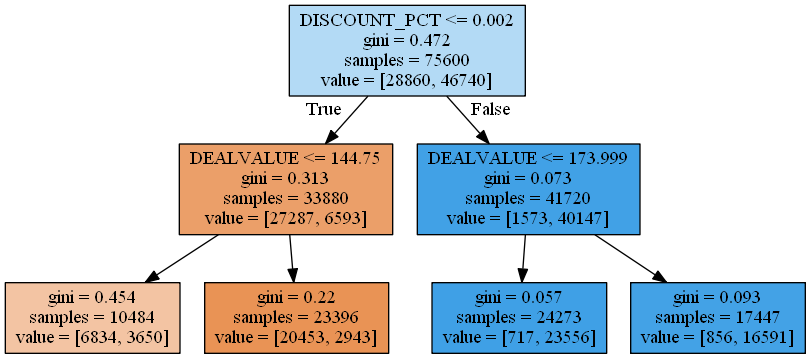

In [54]:
dot_data = StringIO()
export_graphviz(tree_clf, out_file=dot_data, feature_names=features, filled=True)
graph = pydot.graph_from_dot_data(dot_data.getvalue())
Image(graph[0].create_png())

## MOD 2: Random Forest Grid Search

In [55]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV

In [57]:
n_estimators = [10, 50, 100]
max_features = ['auto', 'sqrt']
max_depth = [2, 3, 4]
max_depth.append(None)
min_samples_split = [20, 50, 100]
min_samples_leaf = [10, 20, 40, 100]
bootstrap = [True, False]

params_grid = {'n_estimators': n_estimators, 'max_features': max_features,
               'max_depth': max_depth, 'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf, 'bootstrap': bootstrap}

rf_clf = RandomForestClassifier(random_state=42)

rf_cv = GridSearchCV(rf_clf, params_grid, scoring="f1", cv=3, verbose=2, n_jobs=-1)


rf_cv.fit(X_train, y_train)
best_params = rf_cv.best_params_
print(f"Best parameters: {best_params}")

rf_clf = RandomForestClassifier(**best_params)
rf_clf.fit(X_train, y_train)

print_score(rf_clf, X_train, y_train, X_test, y_test, train=True)
print_score(rf_clf, X_train, y_train, X_test, y_test, train=False)

Fitting 3 folds for each of 576 candidates, totalling 1728 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:   13.1s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:   37.2s
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 989 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 1434 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 1728 out of 1728 | elapsed: 12.7min finished


Best parameters: {'bootstrap': False, 'max_depth': None, 'max_features': 'auto', 'min_samples_leaf': 10, 'min_samples_split': 20, 'n_estimators': 100}
Train Result:
Accuracy Score: 91.96%
_______________________________________________
CLASSIFICATION REPORT:
                      0             1  accuracy     macro avg  weighted avg
precision      0.865956      0.957100  0.919577      0.911528      0.922306
recall         0.933888      0.910740  0.919577      0.922314      0.919577
f1-score       0.898640      0.933345  0.919577      0.915992      0.920096
support    28860.000000  46740.000000  0.919577  75600.000000  75600.000000
_______________________________________________
Confusion Matrix: 
 [[26952  1908]
 [ 4172 42568]]

Test Result:
Accuracy Score: 90.76%
_______________________________________________
CLASSIFICATION REPORT:
                      0             1  accuracy     macro avg  weighted avg
precision      0.852286      0.945414  0.907626      0.898850      0.910187
re